In [1]:
import torch.nn.functional as F
from torchvision import transforms 
from torch.utils.data import DataLoader
import numpy as np
import torch
from torch.optim import Adam
from torch import nn
from datasets import load_dataset
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
import matplotlib.pyplot as plt
import math
from tqdm import tqdm

/Users/viba/machine_learning/project_2/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/viba/machine_learning/project_2/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Part 1. On attention [2 points]

Answer each question in max. 3 lines. Points will be subtracted for long answers so be short and precise. Add your explanations in the below box - NO added handwritten images, write in latex!

1. [0.5 point] You are given an input $X=[x_1,...,x_L]$ (e.g. a sentence of tokenised words). Your goal is to predict the next token $x_i$ conditional on $x_{1},...,x_{i}$. In other words, the $i$-th position can only be influenced by a position $j$ if and only if $j \leq i$, namely a position cannot be influenced by the subsequent positions.
    a. What would be the problem when passing $X$ through attention? Explain using the computations that attention performs, e.g. you can write out the matrix multiplication. 
    b. How could you ensure that the prediction for position $i$ depends solely on positions $j\leq i$? Hint: what in the attention computation should be masked & in what way? 
2. [0.5 point] Let's consider multi-head attention. How does multi-head attention change the computations inside the softmax (the $QK^T$ term) and the product with $V$ and why could this be beneficial to learning? 
3. [0.5 point] Remember that standard attention is given by 
\begin{align}
Q = XW^Q, \; K=XW^K, \; V=XW^V, \;\; \textnormal{with} A(X) = softmax\left(\frac{QK^T}{\sqrt{D}}\right)V
\end{align}
for a sequence $X\in\mathbb{R}^{L\times D}$ with $L$ the sequence length. 
What is the memory and computational cost of attention in terms of the sequence length and where does this come from? 
4. [0.5 point] A big focus these days is on making attention more computationally efficient. The $i$-th row (as a vector) of attention can be rewritten as, 
\begin{align}
A(X)_i = \frac{\sum_{j=1}^L sim(Q_i,K_j)V_j}{\sum_{j=1}^L sim(Q_i,K_j)},
\end{align}
with $sim(q,k)=exp(q^Tk/\sqrt{D})$.
Linear attention would be given by, 
\begin{align}
A(X)_i = \frac{\sum_{j=1}^L \phi(Q_i)^T\phi(K_j)V_j}{\sum_{j=1}^L\phi(Q_i)^T\phi(K_j)}. 
\end{align} 
Explain the relation between regular attentin and linear attention (i.e. what kind of similarity function does linear attention assume and how is the approximation made?) & how the above expression can be rewritten and use this to explain why linear attention computation can be done more efficiently compared to standard attention. 

Fill in your answers below. 

1. 

2. 

3. 

4. 

### Part 2. On diffusion models [12 points]

We will be implementing a diffusion model. We will follow mostly the setup as done here: https://arxiv.org/pdf/2006.11239.pdf so please refer to this work for more details if needed. 

Your goal will be to implement the code for the diffusion model, find the right configuration to train the model, achieve good accuracy and efficiency and finally interpret how the model learns. You will be marked on clean code, concise answers and good results. 

We will be working with the FashionMNIST dataset. You can load the data using the below code. 

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
IMG_SIZE = 28
BATCH_SIZE = 128

# load dataset from the hub
dataset = load_dataset("fashion_mnist")
channels = 1

# define image transformations (e.g. using torchvision)
transform = Compose([
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Lambda(lambda t: (t * 2) - 1)
])

# define function
def transforms(examples):
    examples["pixel_values"] = [transform(image.convert("L")) for image in examples["image"]]
    del examples["image"]
    return examples

transformed_dataset = dataset.with_transform(transforms).remove_columns("label")

dataloader = DataLoader(transformed_dataset['train'], batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

The following helper functions will be useful. In particular, whenever we input a vector (list) of values, this will help to select the right time t output. We will use this in the sampling loops. 

In [4]:
def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

##### 1. The noising process [2 points]

[1.5 pts] Our first step will be to implement the forward process that adds noise to an image. 

We will be adding noise according to a linear schedule, i.e. the noises $\beta_t$, $t=1,...,T$ will come from an equally spaced vector. Implement the `linear_beta_schedule` function. Remember $\alpha_t = 1-\beta_t$ and $\bar \alpha_t = \prod_{s=1}^t \alpha_s$. 

Remember that we have the closed-form solutions for the image at time $t$. Use those in the implementation of `forward_diffusion_sample` instead of a for loop over each noising step. This means you will need to implement `sqrt_one_minus_alphas_cumprod` which represents $\sqrt{1-\bar\alpha_t}$ and `sqrt_alphas_cumprod` which represents $\sqrt{\bar\alpha_t}$. 

Test the function on an image from the dataset using the given code below. 

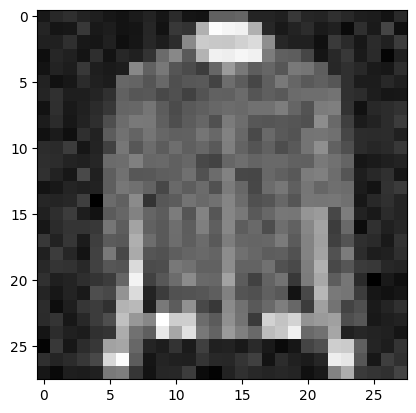

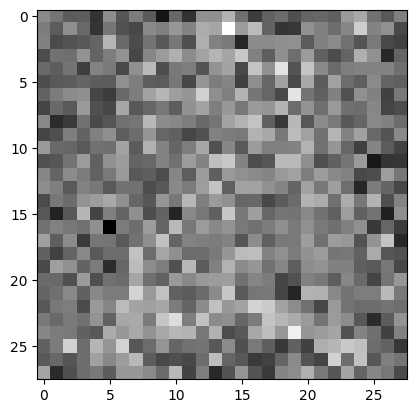

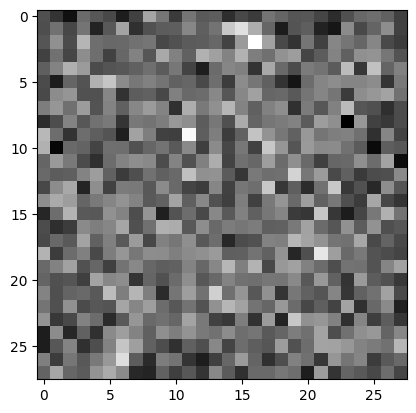

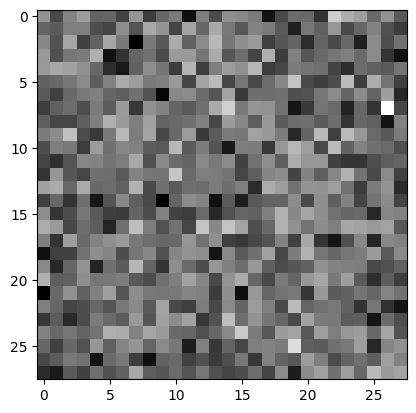

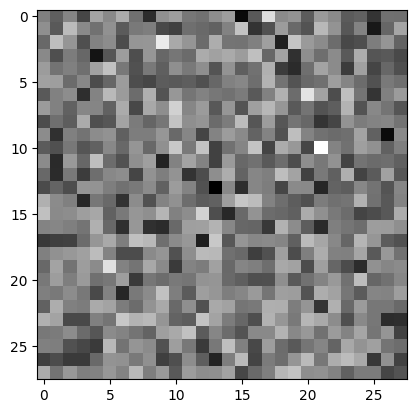

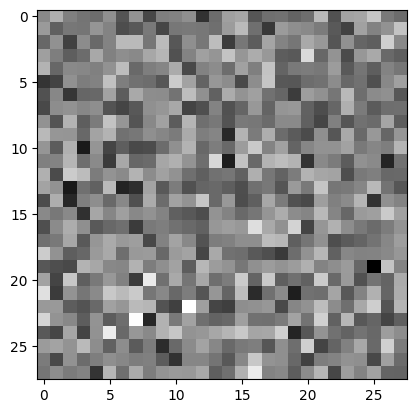

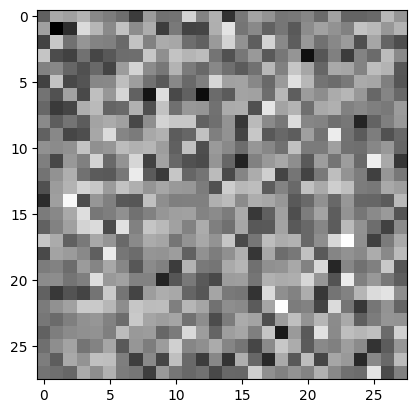

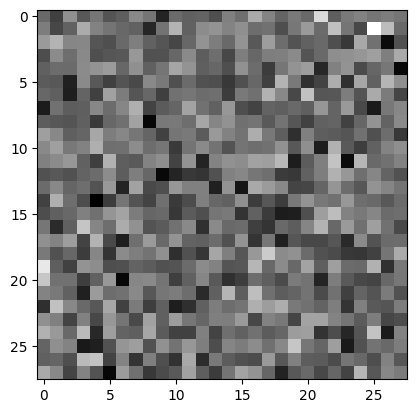

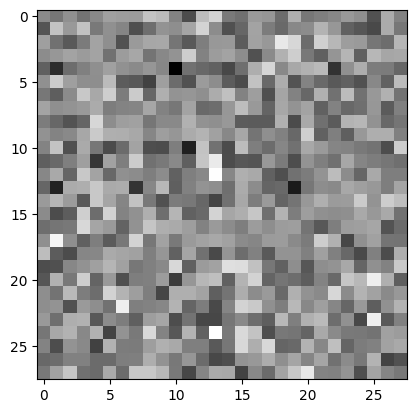

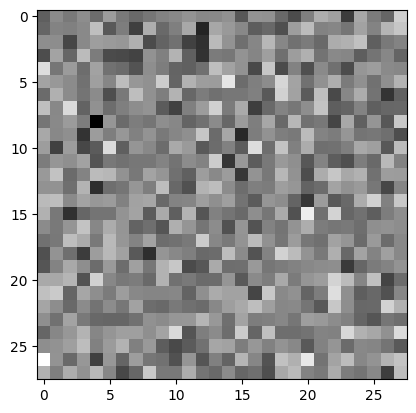

In [67]:
def linear_beta_schedule(timesteps, start=0.00001, end=0.02):
    '''
    output a vector of size timesteps that is equally spaced between start and end; this will be the noise that is added in each time step. 
    '''
    betas = torch.linspace(start, end, timesteps)
    return betas

def cosine_beta_schedule(timesteps, start=0.0001, end=0.03):
    '''
    output a vector of size timesteps that follows a cosine schedule between start and end; this will be the noise that is added in each time step. 
    '''
    # Create a tensor of equally spaced values between -pi/2 and pi/2
    t = torch.linspace(-math.pi/2, math.pi/2, timesteps)
    
    # Apply the cosine function to the tensor, then scale and shift the values to the range [start, end]
    betas = (torch.cos(t) + 1) / 2 * (end - start) + start
    
    return betas

def exponential_beta_schedule(timesteps, start=0.0001, end=0.02):
    '''
    output a vector of size timesteps that follows an exponential schedule between start and end; this will be the noise that is added in each time step. 
    '''
    # Create a tensor of equally spaced values between 0 and 1
    t = torch.linspace(0, 1, timesteps)
    
    # Apply the exponential function to the tensor, then scale and shift the values to the range [start, end]
    betas = (torch.exp(t) - 1) / (math.e - 1) * (end - start) + start
    
    return betas

def softmax_beta_schedule(timesteps, start=0.0001, end=8):
    '''
    output a vector of size timesteps that follows a softmax schedule; this will be the noise that is added in each time step. 
    '''
    # Create a tensor of equally spaced values
    t = torch.linspace(-5, 5, timesteps)
    
    # Apply the softmax function to the tensor
    betas = torch.nn.functional.softmax(t, dim=0)
    
    # Scale and shift the values to the range [start, end]
    betas = betas * (end - start) + start
    
    return betas

def forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    Hint: use the get_index_from_list function to select the right values at time t. 
    """
    #print(f'x shape: {x_0.shape}')
    # Extract the correct value from sqrt_alphas_cumprod and sqrt_one_minus_alphas_cumprod arrays
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod,t,x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod,t,x_0.shape)
    # Calculate the mean and std to sample from the normal distribution
    # Mean size dictates size of sample, std is element/pixel wise
    std = sqrt_one_minus_alphas_cumprod_t.to(device) #*torch.eye(x_0.shape[0], device=device)
    #print(f'std shape: {std.shape}')
    mean = sqrt_alphas_cumprod_t.to(device)*x_0.to(device)
    #print(f'mean shape: {mean.shape}')
    x_t = torch.normal(mean=mean, std=std)
    noise = x_t - x_0
    return x_t, noise

# Define beta schedule
T = 300
#betas = linear_beta_schedule(timesteps=T)
betas = cosine_beta_schedule(timesteps=T)
#betas = exponential_beta_schedule(timesteps=T)
#betas = softmax_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
# ADD HERE THE COMPUTATIONS NEEDED for sqrt_alphas_cumprod and sqrt_one_minus_alphas_cumprod
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_recip_alphas = torch.sqrt(1.0/alphas)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
#posterior_variance = betas*(1. - F.pad(alphas_cumprod[:-1],(1,0),value=1.0))/(1. - alphas_cumprod)

# Simulate forward diffusion
batch = next(iter(dataloader))["pixel_values"]
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    img, noise = forward_diffusion_sample(batch[0,:,:,:], t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    plt.imshow(img.reshape(28, 28), cmap="gray")
    plt.show()

[0.5 pt] Play around with the noise (compare two different beta schedules), present results for the two settings and discuss (in max. 3 lines) how the hyperparameters change the forward sampling. 

# TODO

##### 2. The model for the noise [4 points]

We use a simple form of a UNet to predict the noise in the image. The input into the neural network will be a noisy image and the ouput from the model will be the noise in the image. It is important to also pass in the timestep into the neural network (so the model knows at which time we want to denoise the image) and we do this by passing it through a sinusoidal position embedding. 

[0.5pt] Write code for the Sinusoidal Position Embedding. This should output a matrix $PE$ of size `[timesteps, dimension]` with elements:

\begin{align}
&PE_{pos,2i} = \sin\left(\frac{pos}{10000^{2i/dim}}\right),\\
&PE_{pos,2i+1} = \cos\left(\frac{pos}{10000^{2i/dim}}\right),
\end{align}
where `pos` refers to the time position and `i` refers to the dimension position and `dim` the total dimension we are working with. 

Use however the following identity to implement: 
\begin{align}
\frac{pos}{10000^{2i/dim}} = \exp\left(\log(pos) - \frac{2i}{dim}\log(10000)\right).
\end{align}

In [9]:
# class SinusoidalPositionEmbeddings(nn.Module):
#     def __init__(self, dim):
#         super().__init__()
#         self.dim = dim

#     def forward(self, time):
#         positions = torch.arange(time).unsqueeze(1)
#         #positions = range(len(time))
#         div_term = torch.exp(torch.arange(0, self.dim, 2) * -(torch.log(torch.tensor(10000.0)) / self.dim))
#         pe = torch.zeros(time, self.dim)
#         pe[:, 0::2] = torch.sin(positions * div_term)
#         pe[:, 1::2] = torch.cos(positions * div_term)
#         return pe
    
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        positions = torch.arange(time.shape[0]).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, self.dim, 2) * -(torch.log(torch.tensor(10000.0)) / self.dim))
        pe = torch.zeros(time.shape[0], self.dim)
        pe[:, 0::2] = torch.sin(positions * div_term)
        pe[:, 1::2] = torch.cos(positions * div_term)
        return pe
        

[0.5pt] Visualise the positional embeddings with arbitary time and dimension and discuss what position embeddings do (why do we add them, why this particular embedding structure) in max. 3 lines. 

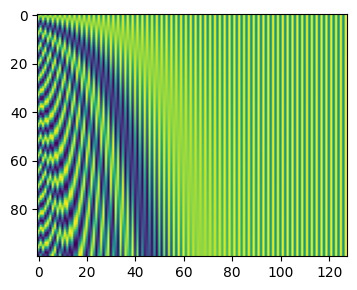

In [10]:
# Write here the code to visualise the positional embedding
model = SinusoidalPositionEmbeddings(128)
plt.figure(figsize=(4,4))
plt.imshow(model(torch.arange(1,101,1)))

Add here your discussion on the positional embeddings.
# TODO

Below is the code for a Block, that will make up the final UNet. 

[0.5pt] Fill in the missing parts. 

Remember that in the UNet architecture, we have a downsampling phase and an upsampling phase. Depending on which phase we are in, we need to make use of the up or down-sample operations. 

[0.5pt] Add here an explanation as to what the block does including the up and downsample operations in maximum 3 lines:

Explanation of a Block: YOUR ANSWER GOES HERE

In [11]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        '''
        in_ch refers to the number of channels in the input to the operation and out_ch how many should be in the output
        '''
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t):
        '''
        Define the forward pass making use of the components above. 
        Time t should get mapped through the time_mlp layer + a relu
        The input x should get mapped through a convolutional layer with relu / batchnorm
        The time embedding should get added the output from the input convolution 
        A second convolution should be applied and finally passed through the self.transform. 
        '''
        time_emb = self.time_mlp(t)
        time_emb = self.relu(time_emb)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.bnorm1(x)
        x = x + time_emb.unsqueeze(-1).unsqueeze(-1)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.bnorm2(x)
        x = self.transform(x)
        return x

In [12]:
torch.tensor([1,2,3,4,5,6,7,8,9,10]).unsqueeze(-1).unsqueeze(-1)

tensor([[[ 1]],

        [[ 2]],

        [[ 3]],

        [[ 4]],

        [[ 5]],

        [[ 6]],

        [[ 7]],

        [[ 8]],

        [[ 9]],

        [[10]]])

[1.5pt] Use the above code to fill in the code for the UNet below. 

In [13]:
class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 1
        down_channels = (2*16, 2*32, 2*64) # These are the channels that we want to obtain in the downsampling stage; DEFINE YOURSELF!
        up_channels = (2*32, 2*32, 2*16) # These are the channels that we want to obtain in the upsampling stage; DEFINE YOURSELF!
        out_dim = 1 # DEFINE THIS CORRECTLY
        time_emb_dim = 32 # DEFINE THIS CORRECTLY

        # Time embedding consists of a Sinusoidal embedding, a linear map that maintains the dimensions and a rectified linear unit activation. 
        # TO WRITE CODE
        self.time_emb = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim),
                                        nn.Linear(time_emb_dim, time_emb_dim),
                                        nn.ReLU())
        
        # Initial projection consisting of a map from image_channels to down_channels[0] with a filter size of e.g. 3 and padding of 1. 
        # TO WRITE CODE
        self.init_proj = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample: use the Blocks given above to define down_channels number of downsampling operations. These operations should cha
        # TO WRITE CODE HERE; HINT: use something like Block(down_channels[i], down_channels[i+1], time_emb_dim) the right number of times. 
        self.down = nn.ModuleList([Block(down_channels[i], down_channels[i+1], time_emb_dim) for i in range(len(down_channels)-1)]) #check number of time
        # Upsample
        # TO WRITE CODE HERE; same logic as the downsample
        self.up = nn.ModuleList([Block(up_channels[i], up_channels[i+1], time_emb_dim, up=True) for i in range(len(up_channels)-1)])#check number times
        
        # Final output: given by a final convolution that maps up_channels[-1] to out_dim with a kernel of size 1. 
        # TO WRITE CODE
        self.final = nn.Conv2d(2*up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        # TO DO 
        time_emb = self.time_emb(timestep)
        # Initial conv
        # TO DO 
        x = self.init_proj(x)
        # Unet: iterate through the downsampling operations and the upsampling operations. Do not forget to include the residual connections 
        # between the outputs from the downsample stage and the upsample stage. 
        # projections = [] #check this step
        # for block in self.down:
        #     print(f'x before block: {x.shape}')
        #     x = block(x, time_emb)
        #     print(f'Block down shape: {x.shape}')
        #     projections.append(x)
        # for i, block in enumerate(self.up):
        #     x = block(x, time_emb)
        #     print(f'Block up shape: {x.shape}')
        #     x = x + projections[-i-1]
        # x = self.final(x)
        skip_connections = []

        for block in self.down:
            skip_connections.append(x)
            #print(f"skip connection shape: {x.shape}")
            x = block(x, time_emb)
        # for block, skip_connection in zip(self.up, skip_connections[::-1]):
        #     x = x + skip_connection
        #     x = block(x, time_emb)
        # x = self.up[0](x, time_emb)
        
        for block, skip_connection in zip(self.up, skip_connections[::-1]):
            x = block(x, time_emb)
            #print(f"up block shape: {x.shape}")
            x = torch.cat((x, skip_connection), dim=1)
            #print(f"concatenated shape: {x.shape}")
            
            
        # x = self.up[0](x, time_emb)
        x = self.final(x)
        return x

[0.5pt] Finally, define a loss function. Note that this loss function should take x_0 and t to sample the forward diffusion model, get a noisy image, use this noisy image in the model to get the noise added and finally compare true added noise and model outputs added noise. 

In [14]:
def get_loss(model, x_0, t):
    '''
    Define the right loss given the model, the true x_0 and the time t
    '''
    # TO WRITE CODE
    x_t, noise = forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    out_noise = model(x_t, t)
    loss = F.mse_loss(out_noise, noise)
    return loss

##### Part 3: The sampling [1 point]

Write a piece of code that can be used to predict the noise and return the denoised image. This function should work on a single image and make sure that the function can be used in the `sample` function properly. Note that we will need the `posterior_variance` denoted by $\sigma$ in the paper and the `sqrt_recip_alphas` given by $1/\alpha_t$. Make sure to set the right choice of $\sigma$ (see the paper). 

In [15]:
# compute posterior_variance 
sqrt_recip_alphas = torch.sqrt(1.0/alphas)
posterior_variance = betas*(1. - F.pad(alphas_cumprod[:-1],(1,0),value=betas[0]))/(1. - alphas_cumprod)
# sqrt_recip_alphas = torch.sqrt(1. / alphas)
# posterior_variance = betas[1:] * (1. - alphas_cumprod[:-1]) / (1. - alphas_cumprod[1:])
print(posterior_variance.shape)
#posterior_variance = betas

@torch.no_grad()
def sample_timestep(x, t, i, posterior_variance, sqrt_one_minus_alphas_cumprod, sqrt_alphas_cumprod):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    Note that it also needs additional arguments about the posterior_variance, sqrt_minus_alphas_cumprod and sqrt_recip_alphas. 
    """
    # TO WRITE CODE
    noise = model(x, t)
    
    #sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    beta_t = get_index_from_list(betas, t, x.shape)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    x_mean = sqrt_recip_alphas_t*(x - beta_t*noise/sqrt_one_minus_alphas_cumprod_t)

    if i == 0:
        return x_mean
    else:
        x = x_mean + torch.sqrt(posterior_variance_t)*torch.randn_like(x)
        return x

@torch.no_grad()
def sample(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)
    imgs = []
    for i in tqdm(reversed(range(0, T)), desc='sampling loop time step', total=T):
        t = torch.full((b,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t, i, posterior_variance, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas)
        imgs.append(img.cpu().numpy())
    return imgs

torch.Size([300])


##### Part 4. Write the training loop and present & interpret your results [6 points]

Code a training loop that instantiates the model, defines an optimiser, defines a number of epochs, iterates over the epochs and the datapoints inside the epoch and for each iteration samples a timestep, uses this timestep to loss function and update parameters based on this. 

Note: this is the part requiring most computational resources. You may need to train the model for quite a few epochs to get good results. Be sure to start on time to ensure enough access to GPUs on Google Colab. 

0.5 point will be given for correct implementation. 

1.5 points will be given according to how many **sensible** samples (with max points given for 10 good samples; scaled accordingly for less samples) you manage to obtain (i.e. the performance of your model in generating good datapoints). 

2 points will be given according to how efficient you can make the train process to still produce at least 10 good samples. You are free to change anything in the architecture! Your output will be compared to my base setup which uses `50` epochs and has a model with `Num params:  929409`. 1 point will be assigned scaled according to how much less epochs you can use and 1 points scaled with how much less params you manage to use. Be sure to print your number of parameters, training epochs and the 10 sensible images. 

2 points will be given for the interpretation of your results that allows us to better understand *how* the model learns. For this you are asked to visualise the generated samples during the training process. Can you identify any properties of *how* the model learns? Are there particular aspects the model starts paying attention to / is able to generate before others? 

The model has 855713 parameters


100%|██████████| 468/468 [08:21<00:00,  1.07s/it]


Epoch 0 loss: 0.0946187898516655


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 162.60it/s]


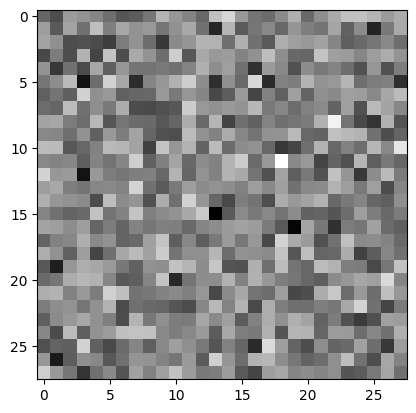

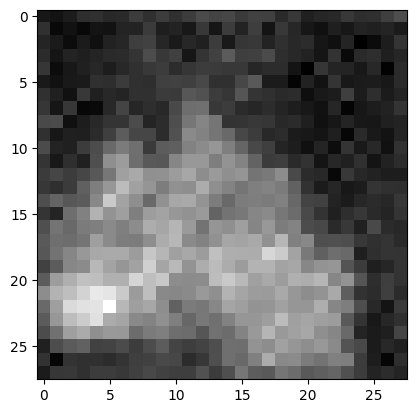

100%|██████████| 468/468 [07:57<00:00,  1.02s/it]


Epoch 1 loss: 0.0819082036614418


sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 317.18it/s]


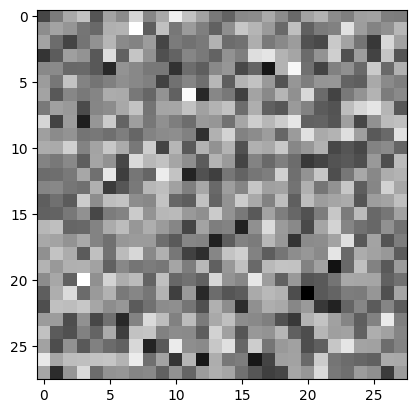

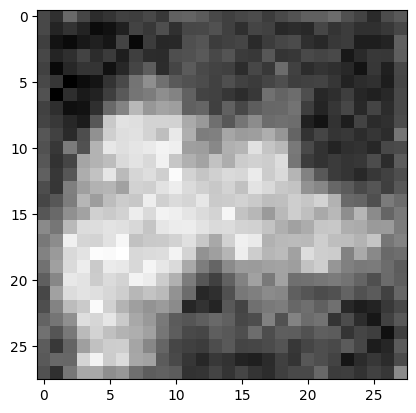

100%|██████████| 468/468 [07:47<00:00,  1.00it/s]


Epoch 2 loss: 0.09445005655288696


sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 312.71it/s]


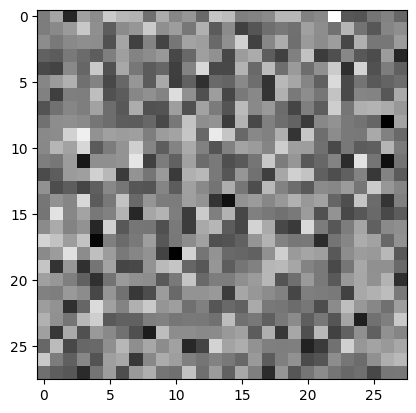

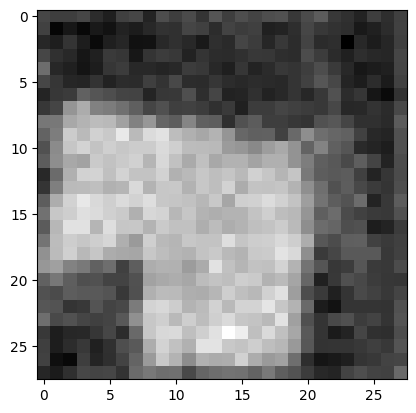

100%|██████████| 468/468 [08:22<00:00,  1.07s/it]


Epoch 3 loss: 0.07455208897590637


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 231.25it/s]


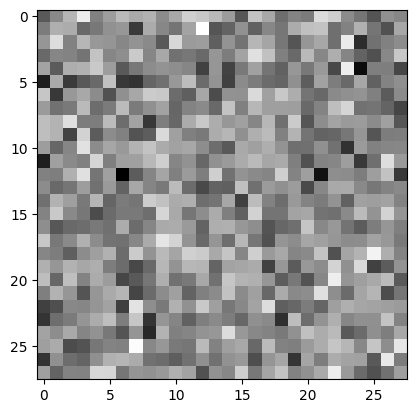

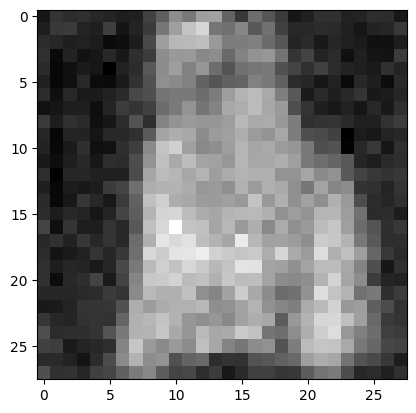

100%|██████████| 468/468 [08:01<00:00,  1.03s/it]


Epoch 4 loss: 0.07261895388364792


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 285.93it/s]


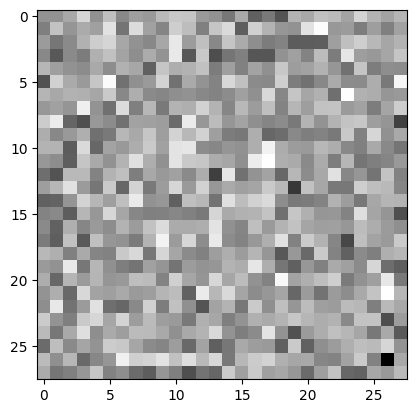

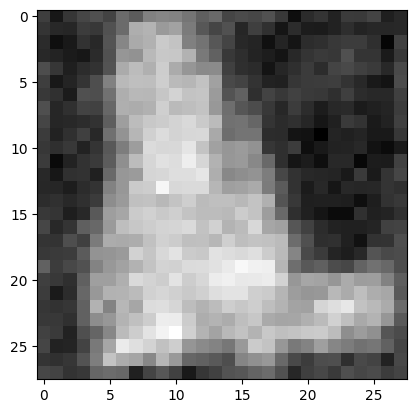

100%|██████████| 468/468 [07:51<00:00,  1.01s/it]


Epoch 5 loss: 0.07140649855136871


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 254.10it/s]


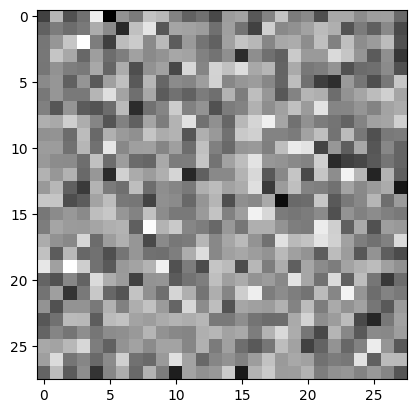

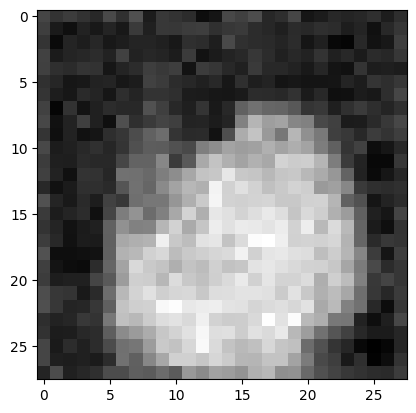

100%|██████████| 468/468 [08:09<00:00,  1.05s/it]


Epoch 6 loss: 0.06366260349750519


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 223.49it/s]


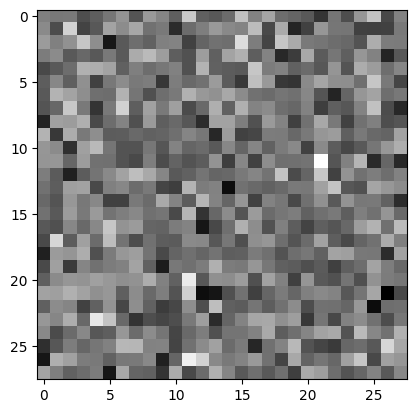

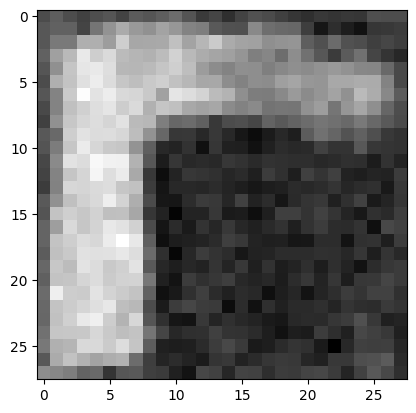

100%|██████████| 468/468 [07:36<00:00,  1.02it/s]


Epoch 7 loss: 0.06356347352266312


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 294.32it/s]


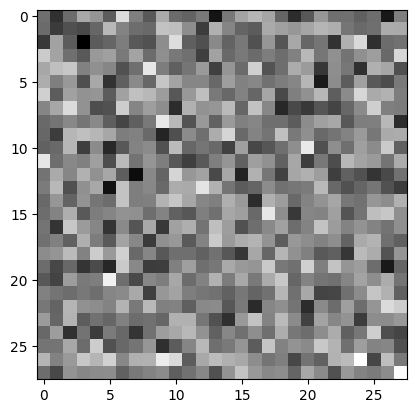

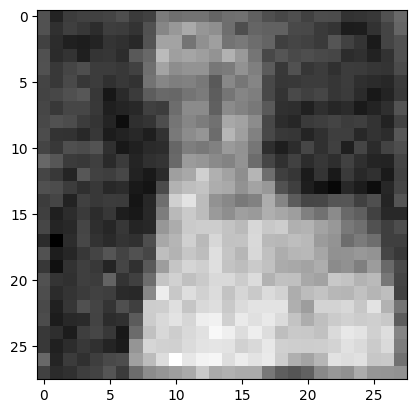

100%|██████████| 468/468 [07:43<00:00,  1.01it/s]


Epoch 8 loss: 0.06179964169859886


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 269.96it/s]


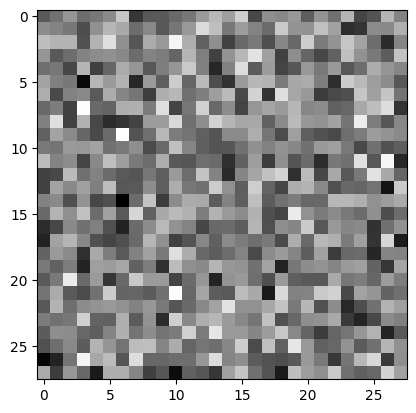

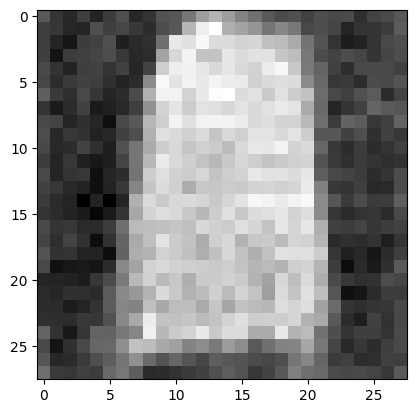

100%|██████████| 468/468 [07:45<00:00,  1.00it/s]


Epoch 9 loss: 0.0604829303920269


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 233.19it/s]


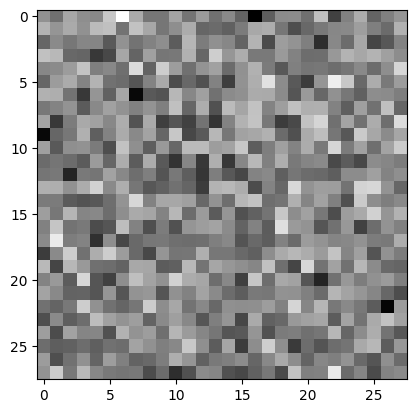

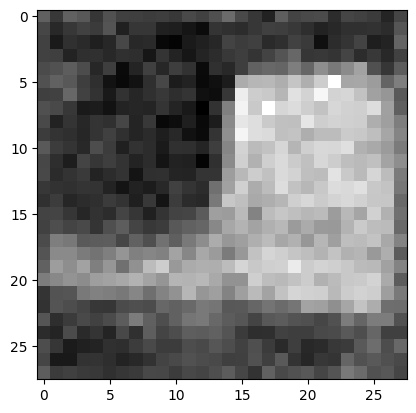

100%|██████████| 468/468 [08:23<00:00,  1.08s/it]


Epoch 10 loss: 0.06639427691698074


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 220.89it/s]


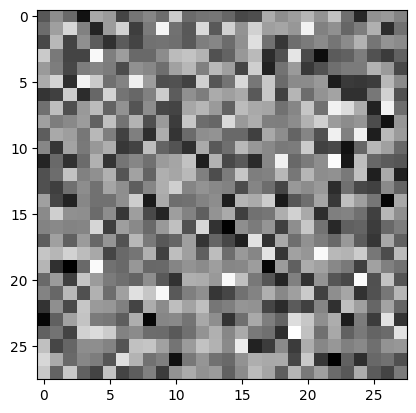

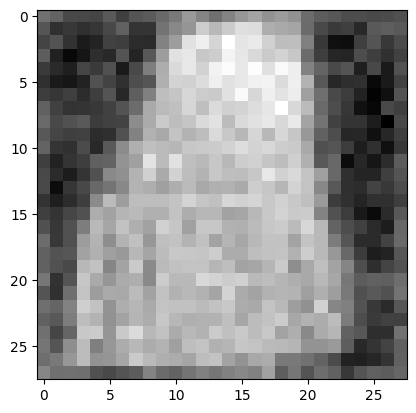

100%|██████████| 468/468 [08:16<00:00,  1.06s/it]


Epoch 11 loss: 0.06175949051976204


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 226.26it/s]


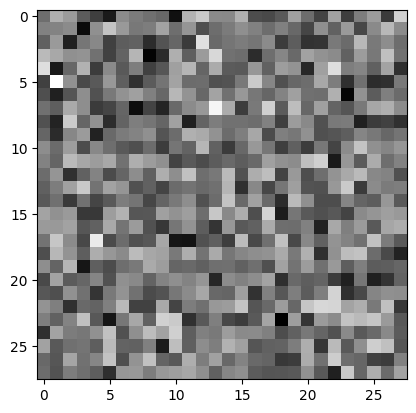

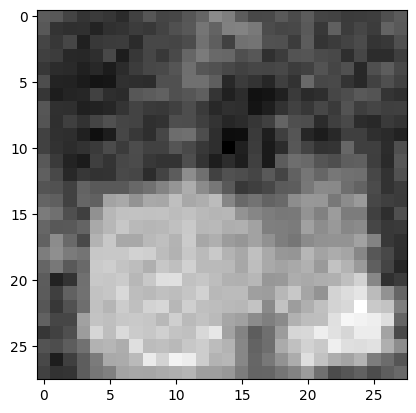

100%|██████████| 468/468 [08:40<00:00,  1.11s/it]


Epoch 12 loss: 0.06815318018198013


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 246.33it/s]


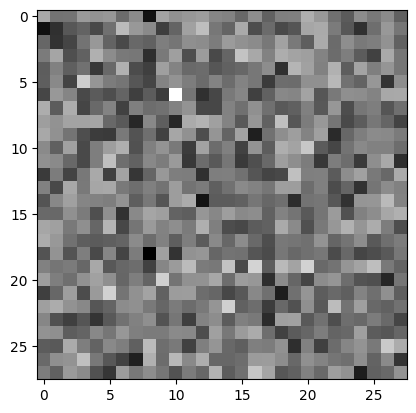

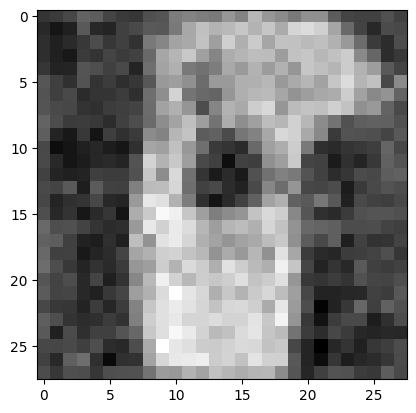

100%|██████████| 468/468 [08:51<00:00,  1.14s/it]


Epoch 13 loss: 0.0666874498128891


sampling loop time step: 100%|██████████| 300/300 [00:06<00:00, 47.86it/s]


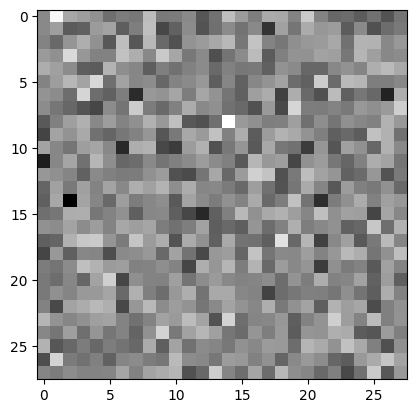

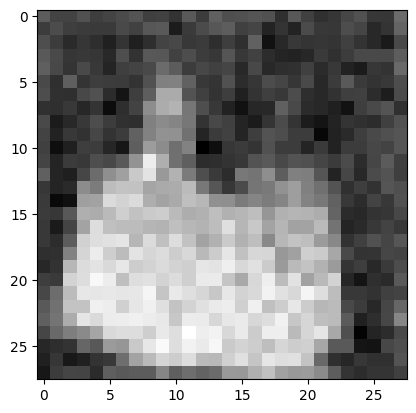

100%|██████████| 468/468 [07:48<00:00,  1.00s/it]


Epoch 14 loss: 0.06181516498327255


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 290.48it/s]


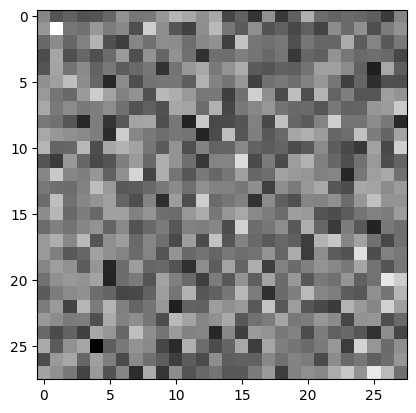

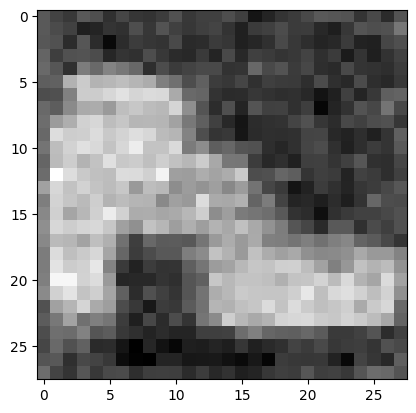

100%|██████████| 468/468 [07:49<00:00,  1.00s/it]


Epoch 15 loss: 0.06923872977495193


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 270.75it/s]


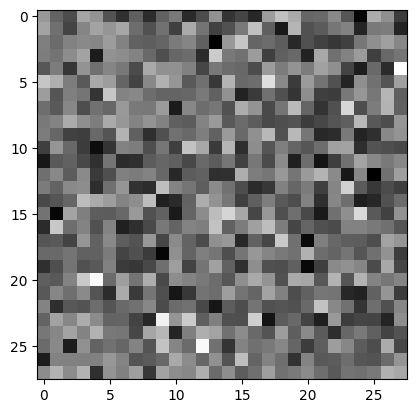

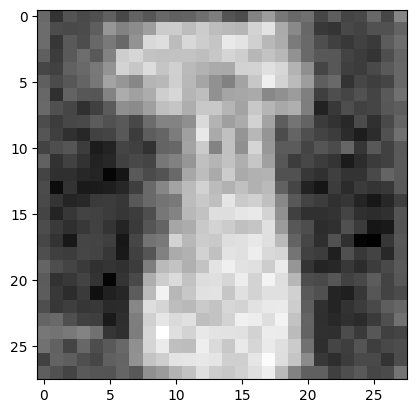

100%|██████████| 468/468 [07:31<00:00,  1.04it/s]


Epoch 16 loss: 0.06658287346363068


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 265.18it/s]


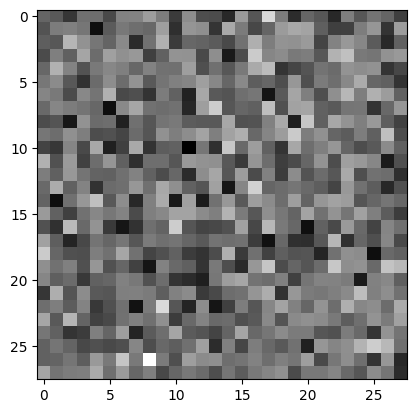

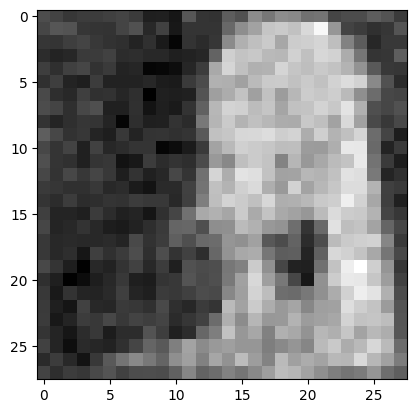

100%|██████████| 468/468 [08:05<00:00,  1.04s/it]


Epoch 17 loss: 0.06419230997562408


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 241.82it/s]


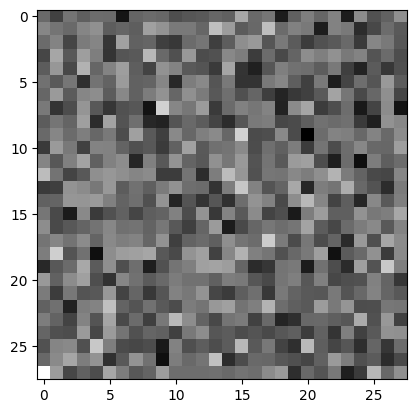

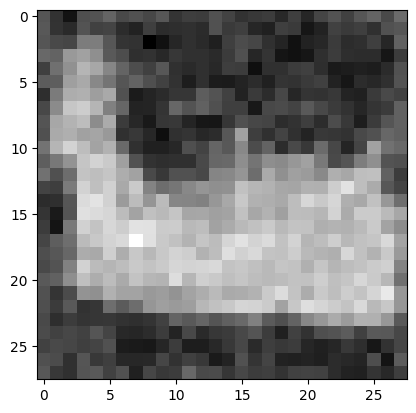

100%|██████████| 468/468 [08:06<00:00,  1.04s/it]


Epoch 18 loss: 0.07498251646757126


sampling loop time step: 100%|██████████| 300/300 [00:01<00:00, 223.56it/s]


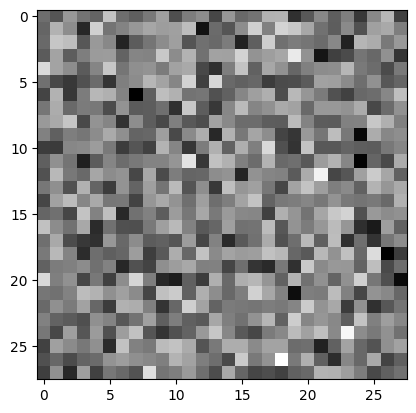

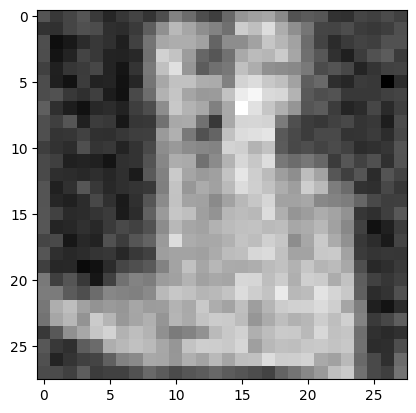

 20%|█▉        | 92/468 [01:42<06:58,  1.11s/it]


KeyboardInterrupt: 

In [16]:
# Code for the training loop goes here
# Define the model
model = SimpleUnet()
model = model.to(device)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model)} parameters')
# Define the optimizer
optimizer = Adam(model.parameters(), lr=0.0001)

# Training loop
for epoch in range(50):
    for batch in tqdm(dataloader):
        optimizer.zero_grad()
        x_0 = batch["pixel_values"]
        t = torch.randint(0, T, (BATCH_SIZE,))
        loss = get_loss(model, x_0, t)
        loss.backward()
        optimizer.step()
        #print(f"Batch loss: {loss.item()}")
        
    print(f"Epoch {epoch} loss: {loss.item()}")
    # Visualize the results
    imgs = sample(model, (1, 1, 28, 28))
    plt.imshow(imgs[0][0].squeeze(), cmap="gray")
    plt.show()
    plt.imshow(imgs[-1][0].squeeze(), cmap="gray")
    plt.show()

model_path = '/Users/viba/machine_learning/project_2/unet_mse_50.pth'
# save model
torch.save(model.state_dict(), model_path)


In [17]:
model_path = '/Users/viba/machine_learning/project_2/unet_mse_18_000.pth'
torch.save(model.state_dict(), model_path)


In [ ]:
#load model
model = SimpleUnet()
model.load_state_dict(torch.load('model.pth'))
model.eval()

Finally, after training is done, use the `sample` to sample new images. 

sampling loop time step: 100%|██████████| 300/300 [00:07<00:00, 40.31it/s]


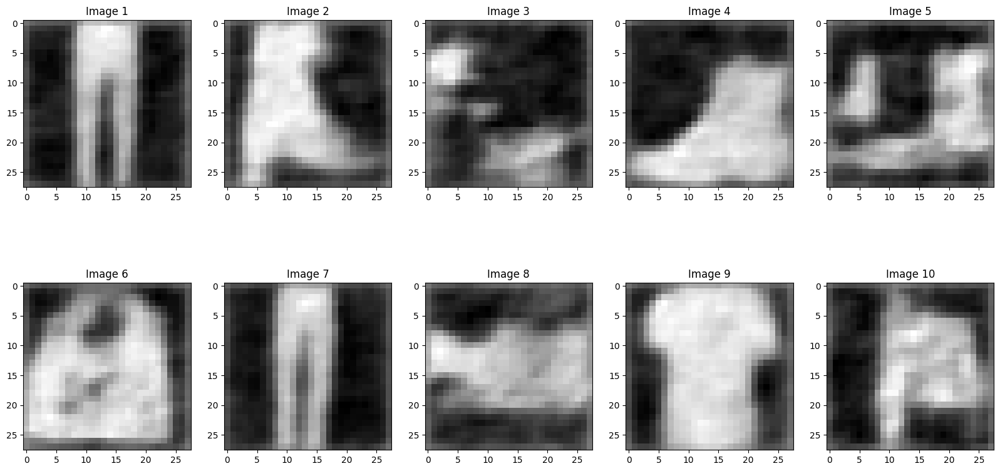

In [62]:
# Code for the plotting of samples goes here
imgs = sample(model, (10, 1, 28, 28))
fig, axs = plt.subplots(2, 5, figsize=(20, 10))
for i in range(10):
    # Calculate the row and column index for the subplot
    row = i // 5
    col = i % 5
    
    # Plot the image in the corresponding subplot
    axs[row, col].imshow(imgs[-1][i][0].squeeze(), cmap="gray")
    axs[row, col].set_title(f"Image {i+1}")

plt.show()
# plt.show()
# plt.imshow(imgs[-1][0].squeeze(), cmap="gray")
# fig, axs = plt.subplots(1, 10, figsize=(20, 10))
# for i in range(10):
# # Plot the first image
#     axs[i].imshow(imgs[-1][i][0].squeeze(), cmap="gray")
#     axs[i].set_title(f"Image {i+1}")



plt.show()

sampling loop time step: 100%|██████████| 300/300 [00:07<00:00, 42.44it/s]


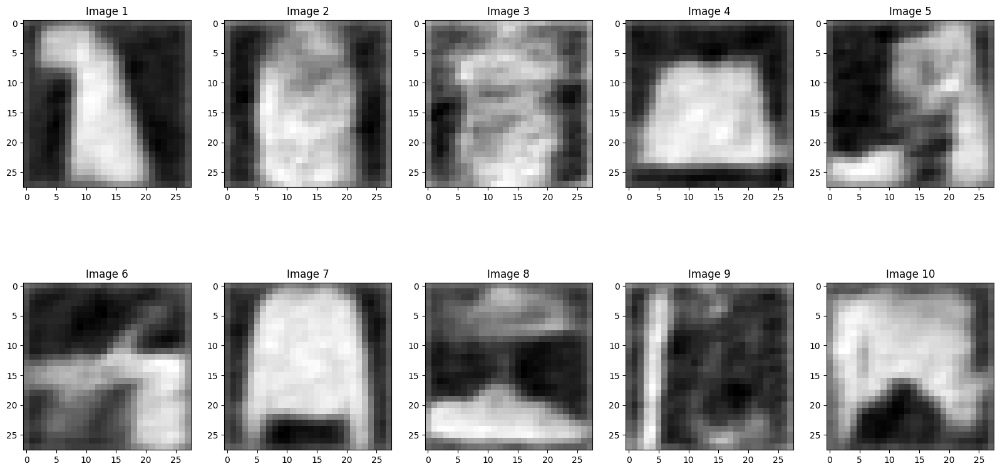

In [68]:
# Code for the plotting of samples goes here
imgs = sample(model, (10, 1, 28, 28))
fig, axs = plt.subplots(2, 5, figsize=(20, 10))
for i in range(10):
    # Calculate the row and column index for the subplot
    row = i // 5
    col = i % 5
    
    # Plot the image in the corresponding subplot
    axs[row, col].imshow(imgs[-1][i][0].squeeze(), cmap="gray")
    axs[row, col].set_title(f"Image {i+1}")

plt.show()
# plt.show()
# plt.imshow(imgs[-1][0].squeeze(), cmap="gray")
# fig, axs = plt.subplots(1, 10, figsize=(20, 10))
# for i in range(10):
# # Plot the first image
#     axs[i].imshow(imgs[-1][i][0].squeeze(), cmap="gray")
#     axs[i].set_title(f"Image {i+1}")



plt.show()

Include your best generated samples below. 

In [ ]:
# Code to show the best samples goes here

Include your most efficient implementation details below. 

In [ ]:
# Code to make your most efficient setup goes here; present all code from above in one Code block
# run it to show final runtimes and print out the total number of parameters in the mode. 

Interpretation of your results goes here. 

In [1]:
# Here goes the code for visualising during training and add a discussion above. 

### Part 3. On DeepDream [5 points]

In this task we will implement a DeepDream model in order to generate ‘dreams’: images enhanced by the neural network. 

Here we will work with a pre-trained model (Inception-V3). The idea is as follows: we will load some image (you can later on choose to load your own image if you want). We will load the Inception-V3 model. We will pass it an input and obtain the activation outputs from a certain layer. We will 'ask' the neural network to maximise the values of the activation, i.e. enhance the image with what those layer activations 'like' to see. For this we will implement a gradient ascent method in order to maximise a norm of the activations over that input. This will change our input into a `dream'. 

1. [1 point] Write a piece of code that will load the Inception-V3 model and allow you to get access to the intermediate activations. 

2. [2 points] Implement the deepdream optimisation loop. We will use gradient ascent to optimise for the norm of the activation. Implement a function that performs this gradient ascent. This function will take as input the number of iterations to perform, the learning rate, and the start image (i.e. the image which the model will enhance). Define in the function a for loop over the number of iterations, obtain the model output, get the output of the hook (hint: use something like `outputs[-1]`), compute the loss which will be L2 norm of this output (i.e. the L2 norm of the activations from your chosen layer), compute the gradients of this L2 norm loss, scale the gradients by their absolute average (hint: scale using `torch.abs(g).mean()`) and define a gradient ascent step over the image. Do not forget to zero out gradients where needed. 

3. [1 point] Implement code to load an image (e.g. https://github.com/pytorch/hub/raw/master/images/dog.jpg) and display the output from your optimisation loop (using e.g. numpy). Present the generated images for different choices of layer activations and different number of optimisation steps. Discuss your results. What is the impact of using different layers? What is the impact of the number of optimisation steps? [0.5 point will be given for the implementation and 1.5 point for a very good discussion]

4. [1 point] In our previous setting we allowed for optimising for a single layer's activation. Change the method such that it will allow to compute the loss (L2 norm) of multiple layers' outputs. Present three different setups using different numbers & combinations of layers and discuss your results in max. 3 lines. 

In [85]:
# YOUR ANSWERS GO HERE


In [3]:
module_names = []
for name, module in model.named_children():
    module_names.append(name)
del module_names[15]

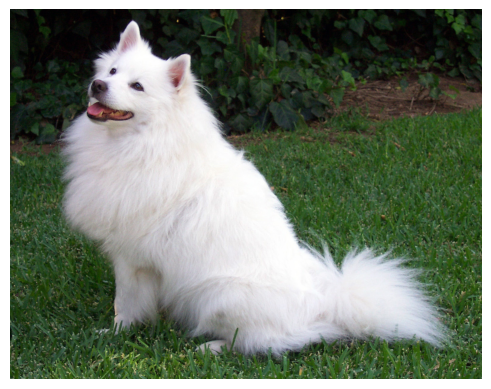

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


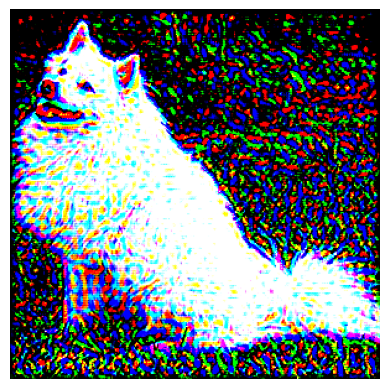

In [4]:
import urllib 
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models
import torch.nn as nn
import urllib
from PIL import Image
from torchvision import transforms

# Load the pre-trained Inception-V3 model
model = models.inception_v3(pretrained=True)

#get image
# url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
# try: urllib.URLopener().retrieve(url, filename)
# except: urllib.request.urlretrieve(url, filename)
IMAGE_PATH = '/Users/viba/machine_learning/project_2/dog.jpg'
image = Image.open(IMAGE_PATH)

#define preprocess
initial_preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = initial_preprocess(image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

# move the input and model to GPU for speed if available
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

# Display the image
plt.imshow(image)
plt.axis('off')
plt.show()

#layer_names = [model.Conv2d_1a_3x3, model.Conv2d_2a_3x3, model.maxpool1, model.Mixed_5b, model.Mixed_5c, model.Mixed_6a, model.Mixed_6b, model.Mixed_6c, model.Mixed_7b, model.avgpool, model.dropout, model.fc]

# Define the deep dream optimization function
def deepdream_optimization(image, model, iterations, lr, layers):
    outputs = []
    for layer in layers:
        dict([*model.named_modules()])[layer].register_forward_hook(lambda module, input, output: outputs.append(output))
    # Set the model to evaluation mode
    model.eval()
    
    # Define the optimizer
    #optimizer = torch.optim.SGD([image.requires_grad_()], lr=lr)
    
    # Perform gradient ascent
    image.requires_grad_(True)
    for i in range(iterations):
        #optimizer.zero_grad()
        
        #image = preprocess(image)
        # Forward pass through the model
        outputs.clear()
        model(image)
        # Get the activations of the chosen layer
        
        # Compute the loss as the L2 norm of the activations
        loss = sum(torch.norm(output) for output in outputs)
        
        # Backward pass to compute gradients
        loss.backward()
        
        g = image.grad
        g = g/torch.abs(g).mean()
        
        # Update the image using gradient ascent
        with torch.no_grad():
            image += g*lr
        
        image.grad.zero_()

    return image

# Perform deep dream optimization
dream_image = deepdream_optimization(input_batch, model, layers=[module_names[1]],iterations=10, lr=0.1)

# Convert the dream image back to a numpy array
dream_image_np = dream_image.squeeze().detach().numpy().transpose((1, 2, 0))

# Display the dream image
plt.imshow(dream_image_np)
plt.axis('off')
plt.show()

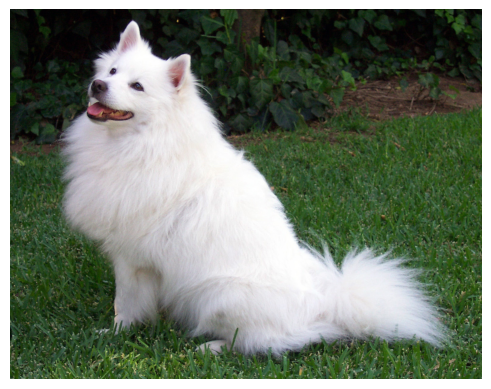

In [10]:
import urllib 
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models
import torch.nn as nn
import urllib
from PIL import Image
from torchvision import transforms

# Load the pre-trained Inception-V3 model
model = models.inception_v3(pretrained=True)

#get image
# url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
# try: urllib.URLopener().retrieve(url, filename)
# except: urllib.request.urlretrieve(url, filename)
IMAGE_PATH = '/Users/viba/machine_learning/project_2/dog.jpg'
image = Image.open(IMAGE_PATH)

#define preprocess
initial_preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = initial_preprocess(image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

# move the input and model to GPU for speed if available
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

# Display the image
plt.imshow(image)
plt.axis('off')
plt.show()

#layer_names = [model.Conv2d_1a_3x3, model.Conv2d_2a_3x3, model.maxpool1, model.Mixed_5b, model.Mixed_5c, model.Mixed_6a, model.Mixed_6b, model.Mixed_6c, model.Mixed_7b, model.avgpool, model.dropout, model.fc]

# Define the deep dream optimization function
def deepdream_optimization(image, model, iterations, lr, layer):
    outputs = []
    dict([*model.named_modules()])[layer].register_forward_hook(lambda module, input, output: outputs.append(output))
    # Set the model to evaluation mode
    model.eval()
    
    # Define the optimizer
    #optimizer = torch.optim.SGD([image.requires_grad_()], lr=lr)
    
    # Perform gradient ascent
    image.requires_grad_(True)
    for i in range(iterations):
        # Forward pass through the model
        outputs.clear()
        model(image)
        # Get the activations of the chosen layer
        # Compute the loss as the L2 norm of the activations
        print(outputs)
        loss = torch.norm(outputs[-1])
        
        # Backward pass to compute gradients
        loss.backward()
        
        g = image.grad
        g = g/torch.abs(g).mean()
        
        # Update the image using gradient ascent
        with torch.no_grad():
            image += g*lr
        
        image.grad.zero_()

    return image

# Perform deep dream optimization
# dream_image = deepdream_optimization(input_batch, model, layer=module_names[1],iterations=10, lr=0.1)

# # Convert the dream image back to a numpy array
# dream_image_np = dream_image.squeeze().detach().numpy().transpose((1, 2, 0))

# # Display the dream image
# plt.imshow(dream_image_np)
# plt.axis('off')
# plt.show()

In [36]:
module_names[15]

'AuxLogits'

In [38]:
input_tensor = initial_preprocess(image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
input_batch.requires_grad_(True)
dream_image = deepdream_optimization(input_batch, model, layers=['AuxLogits'],iterations=10, lr=0.1)
dream_image_np = dream_image.squeeze().detach().numpy().transpose((1, 2, 0))
mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
dream_image_np *= std
dream_image_np += mean
plt.imshow(dream_image_np)
plt.axis('off')
plt.show()

AttributeError: 'int' object has no attribute 'backward'

  0%|          | 0/21 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


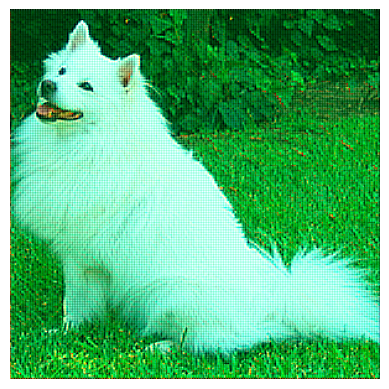

  5%|▍         | 1/21 [00:05<01:43,  5.18s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


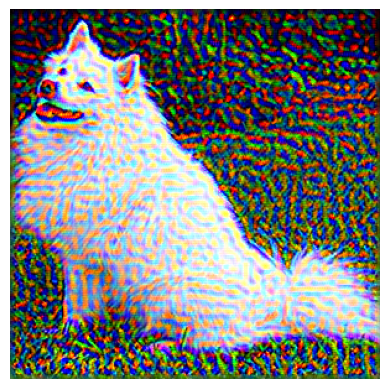

 10%|▉         | 2/21 [00:10<01:38,  5.20s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


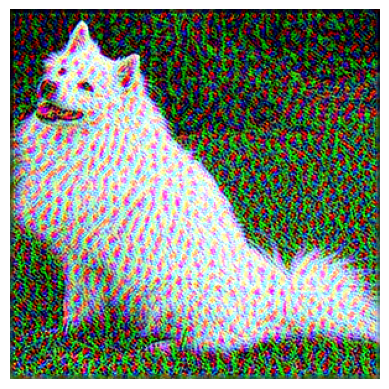

 14%|█▍        | 3/21 [00:15<01:36,  5.35s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


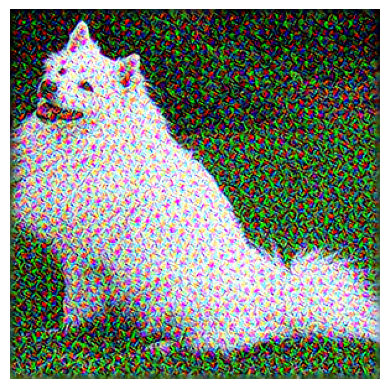

 19%|█▉        | 4/21 [00:21<01:33,  5.48s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


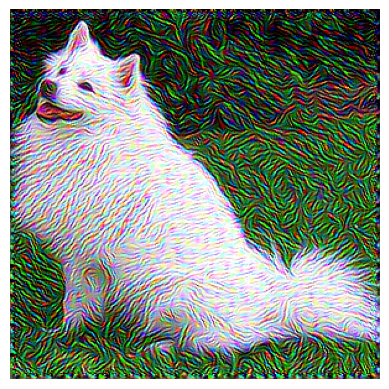

 24%|██▍       | 5/21 [00:27<01:29,  5.59s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


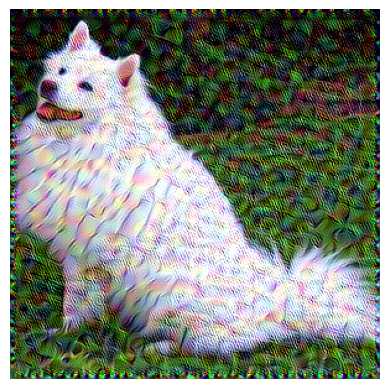

 29%|██▊       | 6/21 [00:33<01:28,  5.88s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


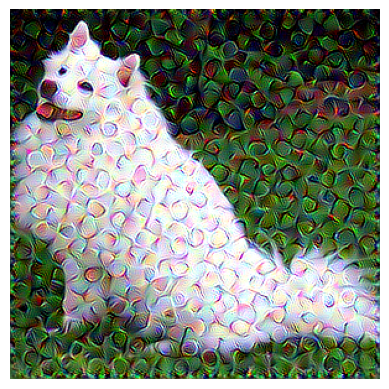

 33%|███▎      | 7/21 [00:40<01:25,  6.09s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


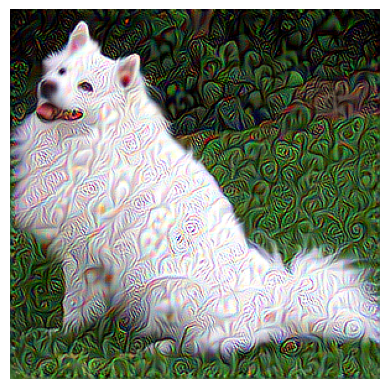

 38%|███▊      | 8/21 [00:47<01:23,  6.38s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


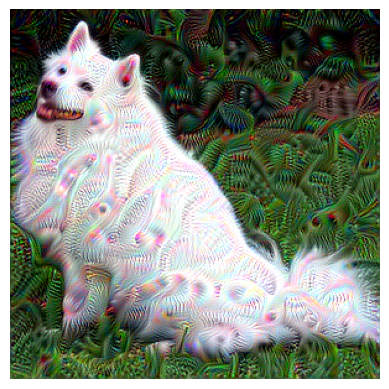

 43%|████▎     | 9/21 [00:54<01:20,  6.70s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


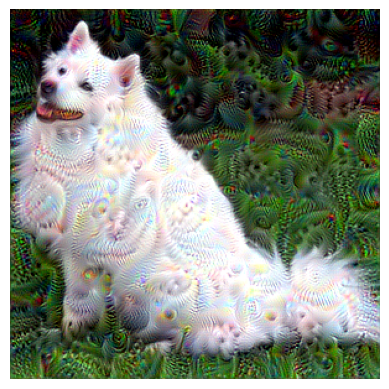

 48%|████▊     | 10/21 [01:02<01:17,  7.05s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


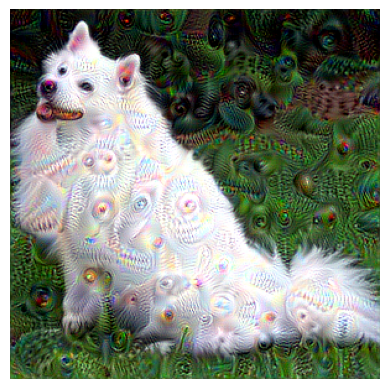

 52%|█████▏    | 11/21 [01:10<01:14,  7.46s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


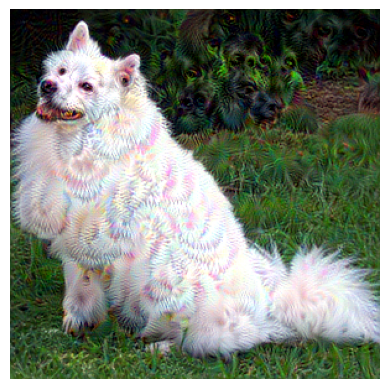

 57%|█████▋    | 12/21 [01:19<01:11,  7.91s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


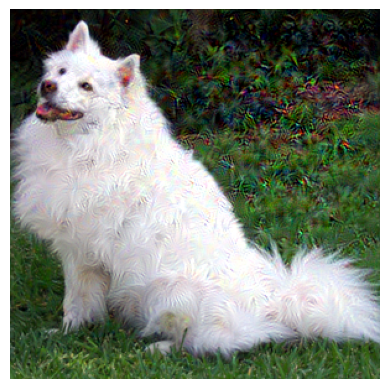

 62%|██████▏   | 13/21 [01:29<01:06,  8.33s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


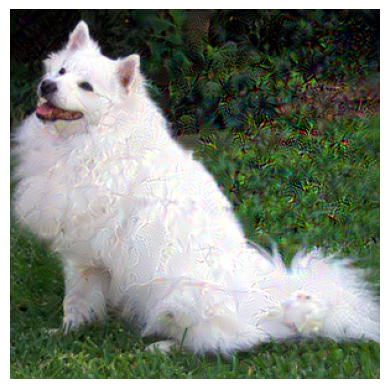

 67%|██████▋   | 14/21 [01:39<01:02,  8.86s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


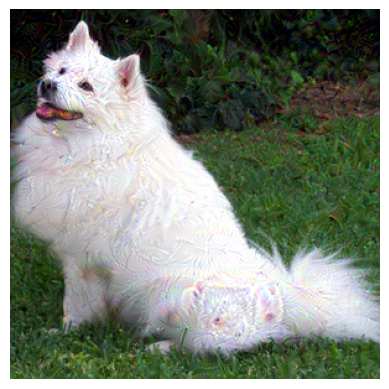

 71%|███████▏  | 15/21 [01:50<00:57,  9.56s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


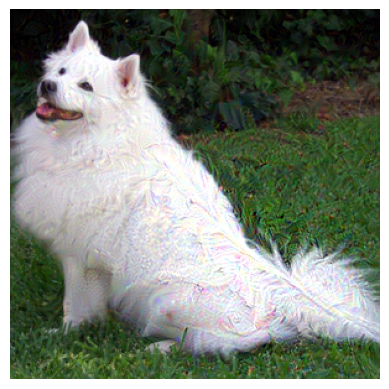

 76%|███████▌  | 16/21 [02:01<00:50, 10.03s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


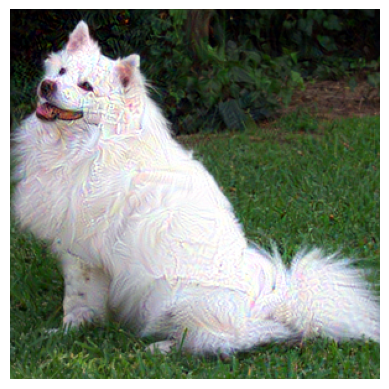

 81%|████████  | 17/21 [02:13<00:42, 10.63s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


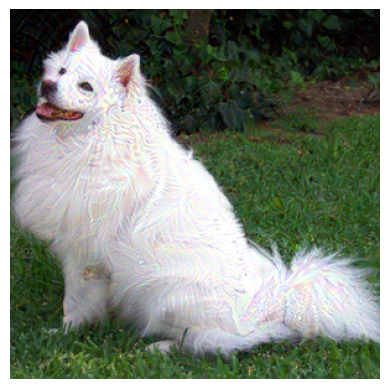

 86%|████████▌ | 18/21 [02:26<00:33, 11.26s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


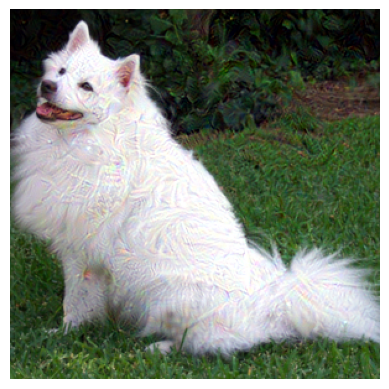

 90%|█████████ | 19/21 [02:39<00:23, 11.77s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


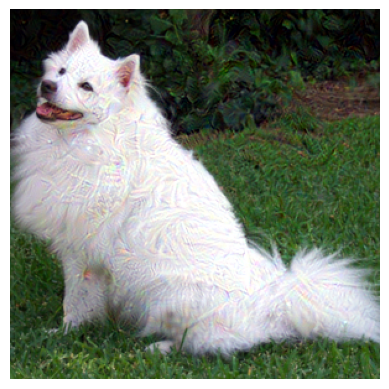

 95%|█████████▌| 20/21 [02:53<00:12, 12.45s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


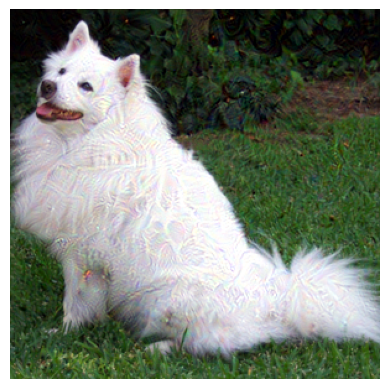

100%|██████████| 21/21 [03:06<00:00,  8.89s/it]


In [5]:
for module_name in tqdm(module_names):
    input_tensor = initial_preprocess(image)
    input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
    input_batch.requires_grad_(True)
    dream_image = deepdream_optimization(input_batch, model, layers=[module_name],iterations=100, lr=0.01)
    dream_image_np = dream_image.squeeze().detach().numpy().transpose((1, 2, 0))
    mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    dream_image_np *= std
    dream_image_np += mean
    plt.imshow(dream_image_np)
    plt.axis('off')
    plt.show()

